# First Asignment 
Exploratory analisis over Seattle Airbnb Data

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import sklearn

import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

sns.set_style()

In [2]:
listing_dir = "Sources/listings.csv"

df_listings = pd.read_csv(listing_dir)

print('number of rows {}'.format(len(df_listings)))
print("number of columns {}".format(len(df_listings.columns)))

#df_listings.columns.values
#df_listings.head(5)

number of rows 3818
number of columns 92


There is a lot of columns, so we must choose the ones we think will work to our purpose

In [3]:
selected_cols =['summary', # written summary
                'space', # written description of space
                'description', # written additional descriptions
                'experiences_offered', # ??
                'neighborhood_overview', # written description over neighborhood
                'notes', # aditional descriptions for the guests
                'transit', # Descriptions about the transit
                'host_about', 
                'host_response_time', #Categorical variable  
                'host_is_superhost', 
                'host_has_profile_pic', 
                'host_identity_verified', 
                'neighbourhood_group_cleansed', #Even better variable 
                'zipcode',
                'latitude', 
                'longitude', 
                'property_type', # Categorical
                'room_type',
                'accommodates', 
                'bathrooms', 
                'bedrooms', 
                'beds', 
                'bed_type',
                'amenities', 
                'square_feet', 
                'price',
                'security_deposit', 
                'cleaning_fee',  
                'guests_included', 
                'extra_people', 
                'number_of_reviews',
                'review_scores_rating',
                'cancellation_policy',
                'require_guest_profile_picture',
                'require_guest_phone_verification',
                'reviews_per_month'
                ]

print('number of selected features: {}'.format(len(selected_cols)))
df_listings = df_listings[selected_cols].copy()

number of selected features: 36


Now find the ammount of missing values in our selected columns to discard more columns or to find a strategy to fill the null values

In [4]:
df_listings[selected_cols].isna().mean().sort_values(ascending=False).head(30)

square_feet                      0.974594
security_deposit                 0.511262
notes                            0.420639
neighborhood_overview            0.270299
cleaning_fee                     0.269775
transit                          0.244631
host_about                       0.224987
review_scores_rating             0.169460
reviews_per_month                0.164222
space                            0.149031
host_response_time               0.136983
summary                          0.046359
bathrooms                        0.004191
zipcode                          0.001833
bedrooms                         0.001572
host_identity_verified           0.000524
host_has_profile_pic             0.000524
host_is_superhost                0.000524
beds                             0.000262
property_type                    0.000262
guests_included                  0.000000
require_guest_profile_picture    0.000000
description                      0.000000
experiences_offered              0

Square feet has many missing values, so it must be discarded. As for the rest of variables some feature engineering must be applied.

In [5]:
df_listings = df_listings.drop(columns='square_feet')


The followwing are the strategies for our data, tranformations and missing values handling

those strategies divide in the following categories

1. **Missing to cero**:
values that must be 0 if null
2. **has been filled**: this are descriptive values that will change to a **True** if it has been filled or **False** on the contrary
3. **map_to_binary**: variables that have a binary value but need to be transformed to 1 and 0
4. **change_na**: categorical variables that must be trated specifically
5. **complete**: variables that need no treatment

In [6]:
missing_to_cero = ['security_deposit',
'review_scores_rating',
'reviews_per_month',
'bathrooms',
'bedrooms',
'beds'
]

has_been_filled_yes_no = ['summary',
'space',
'description',
'experiences_offered',
'neighborhood_overview',
'notes',
'transit',
'host_about',
'cleaning_fee'
]

map_to_binary = ['host_is_superhost', # t - f
'host_has_profile_pic',
'host_identity_verified',
'require_guest_profile_picture',
'require_guest_phone_verification'
]

change_na = ['host_response_time',
'property_type',
'zipcode']

complete = ['host_listings_count',
'street','neighbourhood_group_cleansed',
'latitude','longitude','room_type',
'accommodates','bathrooms','bedrooms','beds','bed_type','amenities',
'price', # Change format
'guests_included',
'extra_people',# Change format
'number_of_reviews',
'cancellation_policy'
]

### Fill na to 0

In [7]:
df_listings['security_deposit'] = df_listings['security_deposit'].str.replace('$','').str.replace(',','').astype(np.float).fillna(0)
df_listings['price'] = df_listings['price'].str.replace('$','').str.replace(',','').astype(np.float).fillna(0)
df_listings['extra_people'] = df_listings['extra_people'].str.replace('$','').str.replace(',','').astype(np.float).fillna(0)

df_listings[missing_to_cero] = df_listings[missing_to_cero].fillna(0)

df_listings[missing_to_cero].describe()

,security_deposit,review_scores_rating,reviews_per_month,bathrooms,bedrooms,beds
count,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000
mean,140.566003,78.518596,1.737514,1.254191,1.305657,1.734940
std,237.387534,35.979061,1.835425,0.594724,0.884219,1.139677
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,87.000000,0.310000,1.000000,1.000000,1.000000
50%,0.000000,95.000000,1.105000,1.000000,1.000000,1.000000
75%,200.000000,98.000000,2.660000,1.000000,2.000000,2.000000
max,5000.000000,100.000000,12.150000,8.000000,7.000000,15.000000


### Has been Filled (true-false)

In [8]:
df_listings['experiences_offered'] = df_listings['experiences_offered'].replace('none',np.nan)
df_listings[has_been_filled_yes_no] = (~df_listings[has_been_filled_yes_no].isna()).astype(int)

df_listings[has_been_filled_yes_no].describe()

,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,host_about,cleaning_fee
count,3818.000000,3818.000000,3818.0,3818.0,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000
mean,0.953641,0.850969,1.0,0.0,0.729701,0.579361,0.755369,0.775013,0.730225
std,0.210290,0.356166,0.0,0.0,0.444172,0.493726,0.429924,0.417628,0.443901
min,0.000000,0.000000,1.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.0,0.0,0.000000,0.000000,1.000000,1.000000,0.000000
50%,1.000000,1.000000,1.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000
75%,1.000000,1.000000,1.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000


The columns **description** and **experiences_offered** does not give any information since it has the same value for all the columns

In [9]:
df_listings.drop(columns=['description','experiences_offered'],inplace=True)
has_been_filled_yes_no.remove('description')
has_been_filled_yes_no.remove('experiences_offered')

### Map t-f to 1-0

In [10]:
dic_transform = {'t':1,'f':0}

df_listings[map_to_binary] = df_listings[map_to_binary].replace(dic_transform).fillna(0).astype(int)

df_listings[map_to_binary].describe()

,host_is_superhost,host_has_profile_pic,host_identity_verified,require_guest_profile_picture,require_guest_phone_verification
count,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000
mean,0.203772,0.997643,0.784966,0.084075,0.098219
std,0.402854,0.048501,0.410900,0.277537,0.297649
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000


### Custom filling

In [11]:
df_listings[change_na].describe(include='all')

,host_response_time,property_type,zipcode
count,3295,3817,3811
unique,4,16,28
top,within an hour,House,98122
freq,1692,1733,420


In [12]:
df_listings['zipcode'] = df_listings['zipcode'].str.replace('\\n','').astype(np.float)
df_listings['zipcode'] = df_listings['zipcode'].fillna(min(df_listings['zipcode'])-1)

df_listings['property_type'] = df_listings['property_type'].fillna('House')
df_listings['host_response_time'] = df_listings['host_response_time'].fillna('Not listed')

df_listings[change_na].describe(include='all')


,host_response_time,property_type,zipcode
count,3818,3818,3.818000e+03
unique,5,16,NaN
top,within an hour,House,NaN
freq,1692,1734,NaN
mean,NaN,NaN,1.007086e+05
std,NaN,NaN,1.602203e+05
min,NaN,NaN,9.810000e+04
25%,NaN,NaN,9.810400e+04
50%,NaN,NaN,9.811200e+04
75%,NaN,NaN,9.812100e+04


there is a zipcode that is strange (**9998122**), a quick search shows that is non existent so it could be discarded

In [13]:
print("number of registers with odd zipcodes: {}".format((df_listings['zipcode']>1e6).sum()))
df_listings = df_listings[df_listings['zipcode']<1e6]

number of registers with odd zipcodes: 1


## Amenities

We have a interesting column: **amenities**, we would divide the values lsited in this columns into individual columns. since some ammenities can increace the value of renting, or at least i think so. 

In [14]:
 df_listings['number_of_amenities'] = df_listings['amenities'].apply(lambda x : len(x.replace('{','').replace('}','').replace('"','').split(',')))

In [15]:
from collections import Counter

amenities_df = df_listings['amenities'].apply(lambda x : x.replace('{','').replace('}','').replace('"','').split(','))

amenities_df = amenities_df.explode().reset_index()
amenities_df['dummy_val'] = 1

amenities_df = amenities_df.pivot(index='index', columns='amenities', values='dummy_val').fillna(0)
amenities_df = amenities_df.drop(columns='')

In [16]:
amenities_df.sum().sort_values()

amenities
Washer / Dryer                   2.0
Other pet(s)                    51.0
Smoking Allowed                 82.0
Doorman                         85.0
Lock on Bedroom Door           100.0
Pool                           159.0
Suitable for Events            209.0
Breakfast                      291.0
Wheelchair Accessible          300.0
Hot Tub                        303.0
Cat(s)                         382.0
Gym                            442.0
Pets Allowed                   472.0
Dog(s)                         509.0
Buzzer/Wireless Intercom       538.0
24-Hour Check-in               616.0
Air Conditioning               677.0
Safety Card                    727.0
Iron                           742.0
Laptop Friendly Workspace      745.0
Hair Dryer                     774.0
Elevator in Building           785.0
Hangers                        846.0
Pets live on this property     883.0
Indoor Fireplace               886.0
Cable TV                      1446.0
First Aid Kit               

now here comes an important process, to understand why is important im gonna take two distinct datasets

the important part some **data engineering** let's group amenities

In [17]:
og_amenities_df = amenities_df.copy()

In [18]:
amenities_df['Washer / Dryer'] = (amenities_df[['Washer','Washer / Dryer','Dryer']].sum(axis=1) > 0).astype(int)
amenities_df = amenities_df.drop(columns=['Washer','Dryer'])

pet_cols = ['Pets live on this property','Pets Allowed','Dog(s)','Cat(s)','Other pet(s)']
amenities_df['pet_friendly'] = (amenities_df[pet_cols].sum(axis=1) > 0).astype(int)
amenities_df = amenities_df.drop(columns=pet_cols)

amenities_df['Internet'] = (amenities_df[['Internet','Wireless Internet']].sum(axis=1) > 0).astype(int)
amenities_df = amenities_df.drop(columns=['Wireless Internet'])


temp_cols = ['Air Conditioning','Heating']
amenities_df['temperature_control'] = (amenities_df[temp_cols].sum(axis=1) > 0).astype(int)
amenities_df = amenities_df.drop(columns=temp_cols)

essentials_col = ['Essentials','Iron','Hair Dryer','Hangers','Shampoo']
amenities_df['Essentials'] = (amenities_df[essentials_col].sum(axis=1) > 0).astype(int)
amenities_df = amenities_df.drop(columns=essentials_col[1:])

fire_safety = ['Smoke Detector','Carbon Monoxide Detector','Fire Extinguisher']
amenities_df['Fire_Safety'] = (amenities_df[fire_safety].sum(axis=1) > 0).astype(int)
amenities_df = amenities_df.drop(columns=fire_safety)


In [19]:
amenities_df.sum().sort_values()

amenities
Smoking Allowed                82.0
Doorman                        85.0
Lock on Bedroom Door          100.0
Pool                          159.0
Suitable for Events           209.0
Breakfast                     291.0
Wheelchair Accessible         300.0
Hot Tub                       303.0
Gym                           442.0
Buzzer/Wireless Intercom      538.0
24-Hour Check-in              616.0
Safety Card                   727.0
Laptop Friendly Workspace     745.0
Elevator in Building          785.0
Indoor Fireplace              886.0
pet_friendly                 1180.0
Cable TV                     1446.0
First Aid Kit                1680.0
Family/Kid Friendly          1963.0
Free Parking on Premises     2167.0
TV                           2574.0
Washer / Dryer               3022.0
Fire_Safety                  3318.0
Kitchen                      3423.0
Essentials                   3434.0
temperature_control          3636.0
Internet                     3692.0
dtype: float64

In [20]:
og_df_listings = df_listings.merge(og_amenities_df,how='inner',left_index=True,right_index=True)
og_df_listings = og_df_listings.drop(columns=['amenities'])

In [21]:
df_listings = df_listings.merge(amenities_df,how='inner',left_index=True,right_index=True)
df_listings = df_listings.drop(columns=['amenities'])

# Descriptive analysis

## Price

count    3817.000000
mean      127.992140
std        90.256448
min        20.000000
25%        75.000000
50%       100.000000
75%       150.000000
max      1000.000000
Name: price, dtype: float64

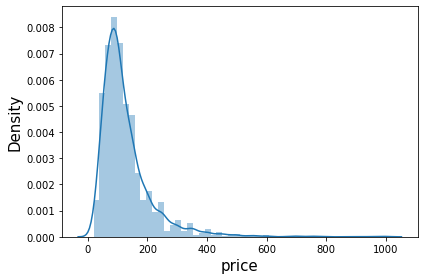

In [22]:
display(df_listings['price'].describe())
ax = sns.distplot(df_listings['price'])

x_lbl = ax.get_xlabel()
ax.set_xlabel(x_lbl, fontsize=15)
y_lbl = ax.get_ylabel()
ax.set_ylabel(y_lbl, fontsize=15)

fig = ax.get_figure()  
fig.tight_layout()
fig.savefig('Images/price_distribution.png')
plt.show()

In [23]:
df_listings['price'] = np.log(df_listings['price'])

count    3817.000000
mean        4.679352
std         0.565547
min         2.995732
25%         4.317488
50%         4.605170
75%         5.010635
max         6.907755
Name: price, dtype: float64

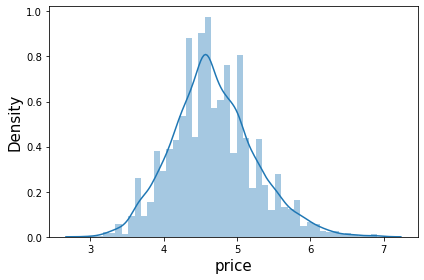

In [24]:
display(df_listings['price'].describe())
ax = sns.distplot(df_listings['price'])

x_lbl = ax.get_xlabel()
ax.set_xlabel(x_lbl, fontsize=15)
y_lbl = ax.get_ylabel()
ax.set_ylabel(y_lbl, fontsize=15)

fig = ax.get_figure()  
fig.tight_layout()
fig.savefig('Images/log_price_distribution.png')
plt.show()

## Amenities

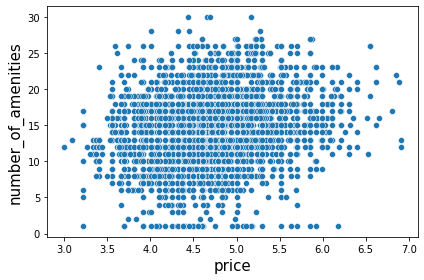

In [25]:

ax = sns.scatterplot('price','number_of_amenities',data=df_listings)

x_lbl = ax.get_xlabel()
ax.set_xlabel(x_lbl, fontsize=15)
y_lbl = ax.get_ylabel()
ax.set_ylabel(y_lbl, fontsize=15)

fig = ax.get_figure()  
fig.tight_layout()
fig.savefig('Images/price_vs_num_amenities.png')
plt.show()

Smoking Allowed                82.0
Doorman                        85.0
Lock on Bedroom Door          100.0
Pool                          159.0
Suitable for Events           209.0
Breakfast                     291.0
Wheelchair Accessible         300.0
Hot Tub                       303.0
Gym                           442.0
Buzzer/Wireless Intercom      538.0
24-Hour Check-in              616.0
Safety Card                   727.0
Laptop Friendly Workspace     745.0
Elevator in Building          785.0
Indoor Fireplace              886.0
pet_friendly                 1180.0
Cable TV                     1446.0
First Aid Kit                1680.0
Family/Kid Friendly          1963.0
Free Parking on Premises     2167.0
TV                           2574.0
Washer / Dryer               3022.0
Fire_Safety                  3318.0
Kitchen                      3423.0
Essentials                   3434.0
temperature_control          3636.0
Internet                     3692.0
dtype: float64

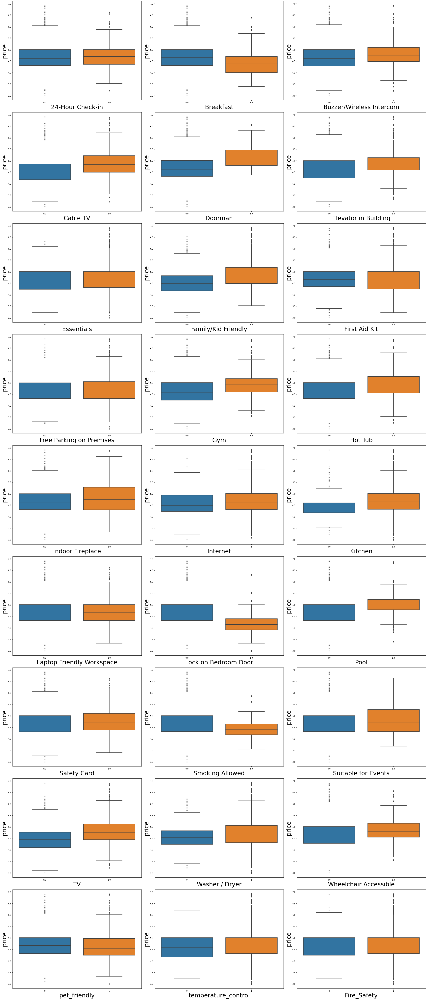

In [26]:
from math import ceil

display(df_listings[amenities_df.columns].sum().sort_values())
n_cols = 3
n_rows = ceil(len(amenities_df.columns)/n_cols)

fig, axes = plt.subplots(n_rows,n_cols,figsize=(30,70))
flatten_axes = axes.flatten()

for i in range(0,len(amenities_df.columns)):

    sns.boxplot(data=df_listings,y='price',x = amenities_df.columns[i],ax=flatten_axes[i],linewidth=2.5) 
    # sns.violinplot(data=df_listings,y='price',x = amenities_df.columns[i],hue = amenities_df.columns[i],ax=flatten_axes[i]) 

    x_lbl = flatten_axes[i].get_xlabel()
    flatten_axes[i].set_xlabel(x_lbl, fontsize=30)
    y_lbl = flatten_axes[i].get_ylabel()
    flatten_axes[i].set_ylabel(y_lbl, fontsize=30)

fig.tight_layout()
fig.savefig('Images/amenities_boxplot.png')
plt.show()

## Other categorical variables

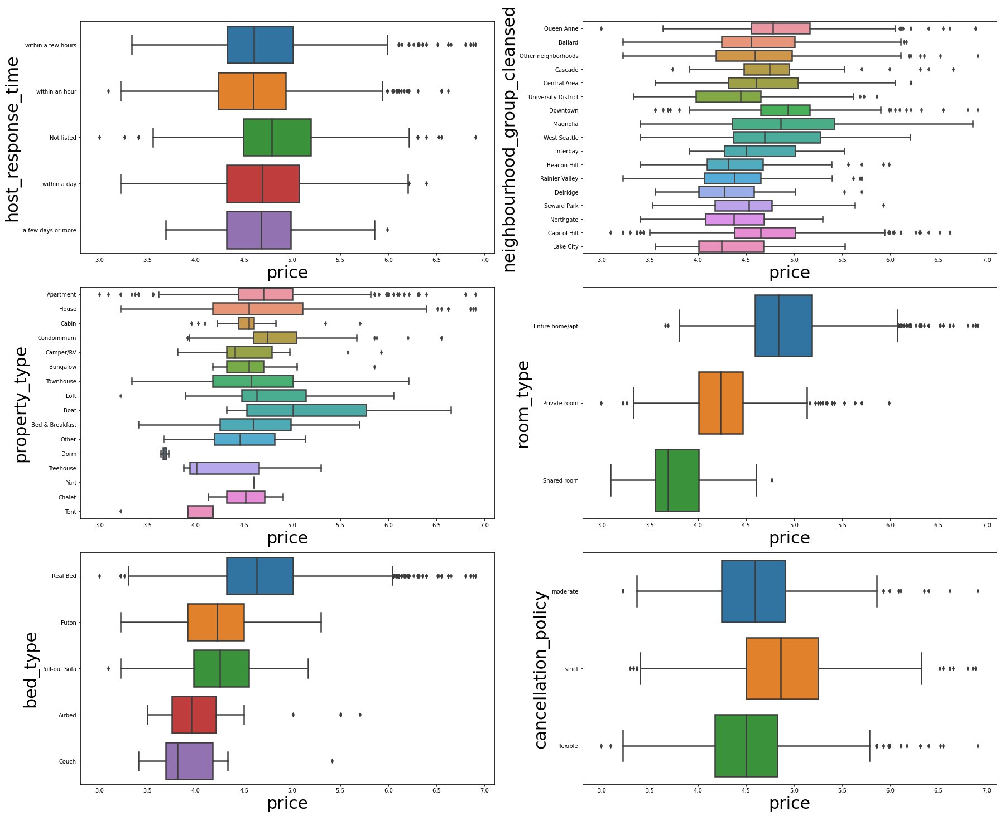

In [27]:
cat_var = df_listings.select_dtypes(include=['object']).columns
n_col = 2
n_row = ceil(len(cat_var)/n_col)

fig, axes = plt.subplots(n_row,n_col,figsize=(25,20))
flatten_axes = axes.flatten()

for i in np.arange(0,len(cat_var)):
    sns.boxplot(data=df_listings, x='price',y=cat_var[i],ax=flatten_axes[i],linewidth=2.5)

    x_lbl = flatten_axes[i].get_xlabel()
    flatten_axes[i].set_xlabel(x_lbl, fontsize=30)
    y_lbl = flatten_axes[i].get_ylabel()
    flatten_axes[i].set_ylabel(y_lbl, fontsize=30)

fig.tight_layout()
fig.savefig('Images/multiclass_categorical_boxplot.png')
plt.show()

In [28]:
display(df_listings[cat_var].describe())

[df_listings[x].value_counts() for x in cat_var]

,host_response_time,neighbourhood_group_cleansed,property_type,room_type,bed_type,cancellation_policy
count,3817,3817,3817,3817,3817,3817
unique,5,17,16,3,5,3
top,within an hour,Other neighborhoods,House,Entire home/apt,Real Bed,strict
freq,1692,794,1733,2541,3656,1417


[within an hour        1692
 within a few hours     968
 within a day           596
 Not listed             523
 a few days or more      38
 Name: host_response_time, dtype: int64,
 Other neighborhoods    794
 Capitol Hill           567
 Downtown               530
 Central Area           368
 Queen Anne             295
 Ballard                230
 West Seattle           203
 Rainier Valley         159
 University District    122
 Beacon Hill            118
 Cascade                 89
 Northgate               80
 Delridge                79
 Lake City               67
 Magnolia                61
 Seward Park             44
 Interbay                11
 Name: neighbourhood_group_cleansed, dtype: int64,
 House              1733
 Apartment          1708
 Townhouse           118
 Condominium          91
 Loft                 40
 Bed & Breakfast      37
 Other                22
 Cabin                21
 Bungalow             13
 Camper/RV            13
 Boat                  8
 Tent            

In [29]:
dic_property_type = dict.fromkeys(['Cabin','Camper/RV','Bungalow','Boat','Tent','Treehouse','Dorm','Chalet','Yurt','Bed & Breakfast'],'Other')

df_listings['property_type'] = df_listings['property_type'].replace(dic_property_type)

dic_room_type = dict.fromkeys(['Futon','Pull-out Sofa','Airbed','Couch'],'Other')
df_listings['bed_type'] = df_listings['bed_type'].replace(dic_room_type)

In [30]:
display(df_listings[cat_var].describe())

[df_listings[x].value_counts() for x in cat_var]

,host_response_time,neighbourhood_group_cleansed,property_type,room_type,bed_type,cancellation_policy
count,3817,3817,3817,3817,3817,3817
unique,5,17,6,3,2,3
top,within an hour,Other neighborhoods,House,Entire home/apt,Real Bed,strict
freq,1692,794,1733,2541,3656,1417


[within an hour        1692
 within a few hours     968
 within a day           596
 Not listed             523
 a few days or more      38
 Name: host_response_time, dtype: int64,
 Other neighborhoods    794
 Capitol Hill           567
 Downtown               530
 Central Area           368
 Queen Anne             295
 Ballard                230
 West Seattle           203
 Rainier Valley         159
 University District    122
 Beacon Hill            118
 Cascade                 89
 Northgate               80
 Delridge                79
 Lake City               67
 Magnolia                61
 Seward Park             44
 Interbay                11
 Name: neighbourhood_group_cleansed, dtype: int64,
 House          1733
 Apartment      1708
 Other           127
 Townhouse       118
 Condominium      91
 Loft             40
 Name: property_type, dtype: int64,
 Entire home/apt    2541
 Private room       1159
 Shared room         117
 Name: room_type, dtype: int64,
 Real Bed    3656
 Othe

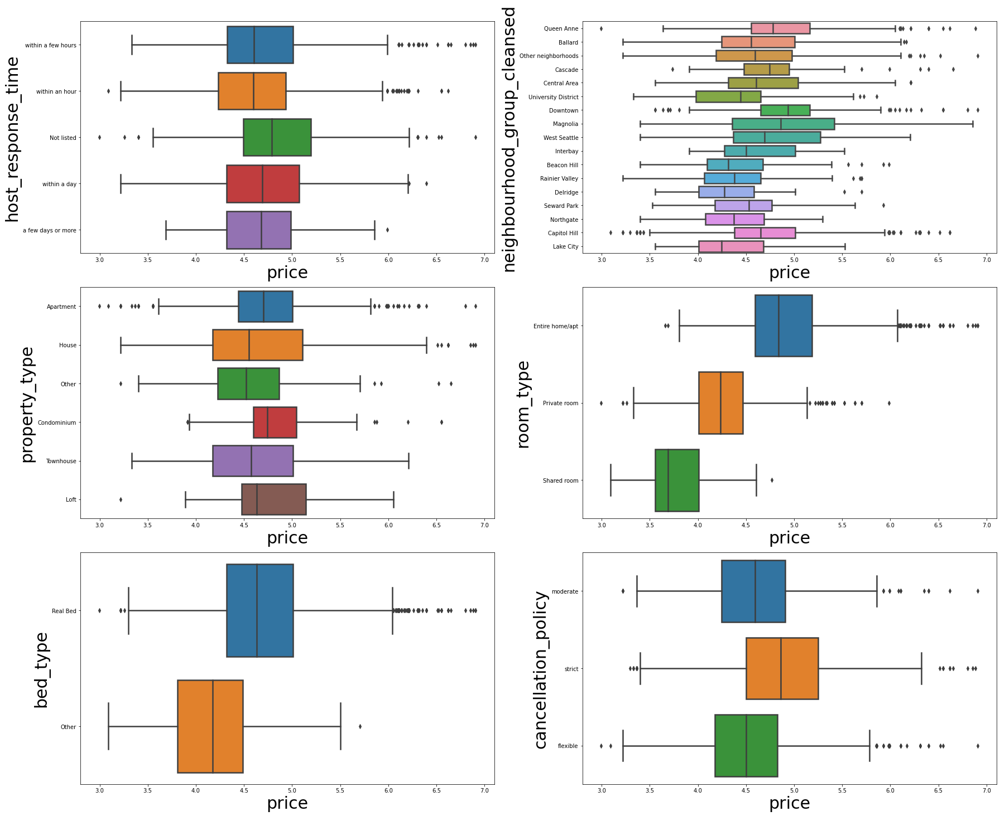

In [31]:
n_col = 2
n_row = ceil(len(cat_var)/n_col)

fig, axes = plt.subplots(n_row,n_col,figsize=(25,20))
flatten_axes = axes.flatten()

for i in np.arange(0,len(cat_var)):
    sns.boxplot(data=df_listings, x='price',y=cat_var[i],ax=flatten_axes[i],linewidth=2.5)

    x_lbl = flatten_axes[i].get_xlabel()
    flatten_axes[i].set_xlabel(x_lbl, fontsize=30)
    y_lbl = flatten_axes[i].get_ylabel()
    flatten_axes[i].set_ylabel(y_lbl, fontsize=30)

fig.tight_layout()
fig.savefig('Images/multiclass_categorical_boxplot_grouped.png')
plt.show()

## Descpriptive columns, has been filled yes - no

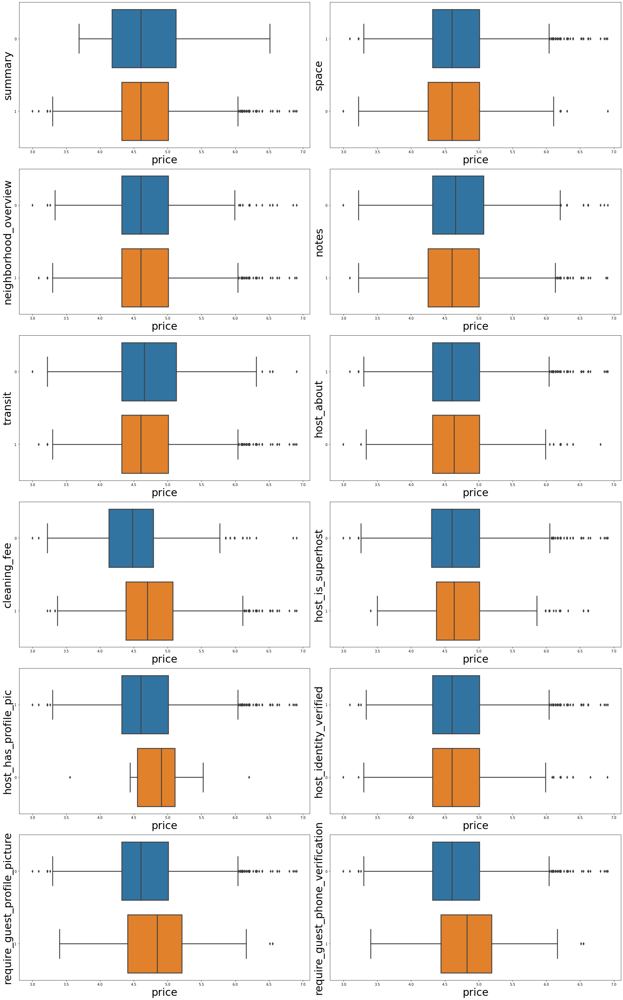

In [32]:
dic_transform = {1:'1',0:'0'}

binary_var = np.append(has_been_filled_yes_no,map_to_binary)

df = df_listings.copy()
df[binary_var] = df[binary_var].replace(dic_transform)

n_col = 2
n_row = ceil(len(binary_var)/n_col)

fig, axes = plt.subplots(n_row,n_col,figsize=(25,40))
flatten_axes = axes.flatten()

for i in np.arange(0,len(binary_var)):
    sns.boxplot(data=df, x='price',y=binary_var[i],ax=flatten_axes[i],linewidth=2.5)

    x_lbl = flatten_axes[i].get_xlabel()
    flatten_axes[i].set_xlabel(x_lbl, fontsize=30)
    y_lbl = flatten_axes[i].get_ylabel()
    flatten_axes[i].set_ylabel(y_lbl, fontsize=30)

fig.tight_layout()
fig.savefig('Images/categorical_boxplot_grouped.png')
plt.show()

## Numerical columns

,zipcode,latitude,longitude,accommodates,bathrooms,bedrooms,beds,security_deposit,guests_included,extra_people,number_of_reviews,review_scores_rating,reviews_per_month,number_of_amenities
count,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000,3817.000000
mean,98115.665968,47.628966,-122.333109,3.349751,1.254257,1.305737,1.735132,140.602829,1.672780,10.670422,22.228976,78.512968,1.737708,14.374116
std,16.488602,0.043057,0.031747,1.977738,0.594787,0.884321,1.139764,237.407729,1.311166,17.587378,37.734271,35.982094,1.835627,4.702462
min,98100.000000,47.505088,-122.417219,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,98104.000000,47.609418,-122.354328,2.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,87.000000,0.310000,11.000000
50%,98112.000000,47.623604,-122.328886,3.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,9.000000,95.000000,1.110000,14.000000
75%,98121.000000,47.662701,-122.310799,4.000000,1.000000,2.000000,2.000000,200.000000,2.000000,20.000000,26.000000,98.000000,2.660000,17.000000
max,98199.000000,47.733358,-122.240607,16.000000,8.000000,7.000000,15.000000,5000.000000,15.000000,300.000000,474.000000,100.000000,12.150000,30.000000


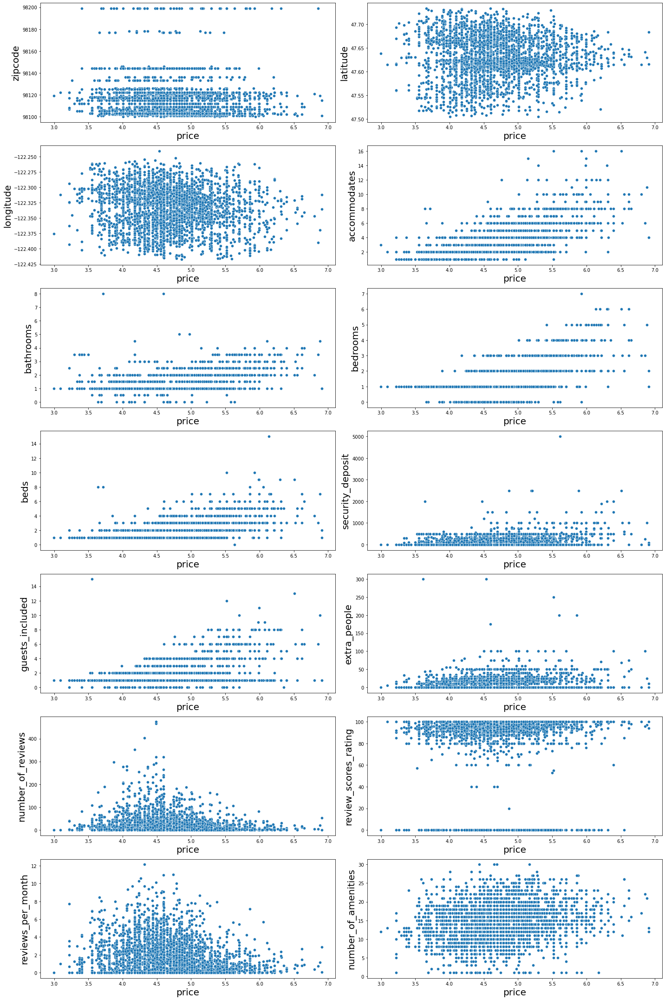

In [33]:
numeric_var = [x for x in df_listings.select_dtypes(include=['number']).columns if x not in np.append(np.append(binary_var,amenities_df.columns),['price']) ]

display(df_listings[numeric_var].describe())

n_col = 2
n_row = ceil(len(numeric_var)/n_col)

fig, axes = plt.subplots(n_row,n_col,figsize=(20,30))
flatten_axes = axes.flatten()

for i in np.arange(0,len(numeric_var)):

    
    sns.scatterplot(data=df[df['zipcode']<= 1e5], x='price',y=numeric_var[i],ax=flatten_axes[i])

    x_lbl = flatten_axes[i].get_xlabel()
    flatten_axes[i].set_xlabel(x_lbl, fontsize=20)
    y_lbl = flatten_axes[i].get_ylabel()
    flatten_axes[i].set_ylabel(y_lbl, fontsize=20)

fig.tight_layout()
fig.savefig('Images/categorical_boxplot.png')
plt.show()

In [34]:
# pd.set_option('display.max_columns', 100)
# df_listings.sort_values(by='price',ascending=False).head(10)

# Encoding

To create a model it is necessary to deal with the categorical variables, in order to do so, one hot encoding will be applied

In [35]:
for var in  cat_var:
    # for each cat add dummy var, drop original column
    df_listings = pd.concat([df_listings.drop(var, axis=1), pd.get_dummies(df_listings[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)
    og_df_listings = pd.concat([og_df_listings.drop(var, axis=1), pd.get_dummies(og_df_listings[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)

# Correlation

Check if there high correlated variables, and deal with them since high correlated values could affect the model negatively

<AxesSubplot:>

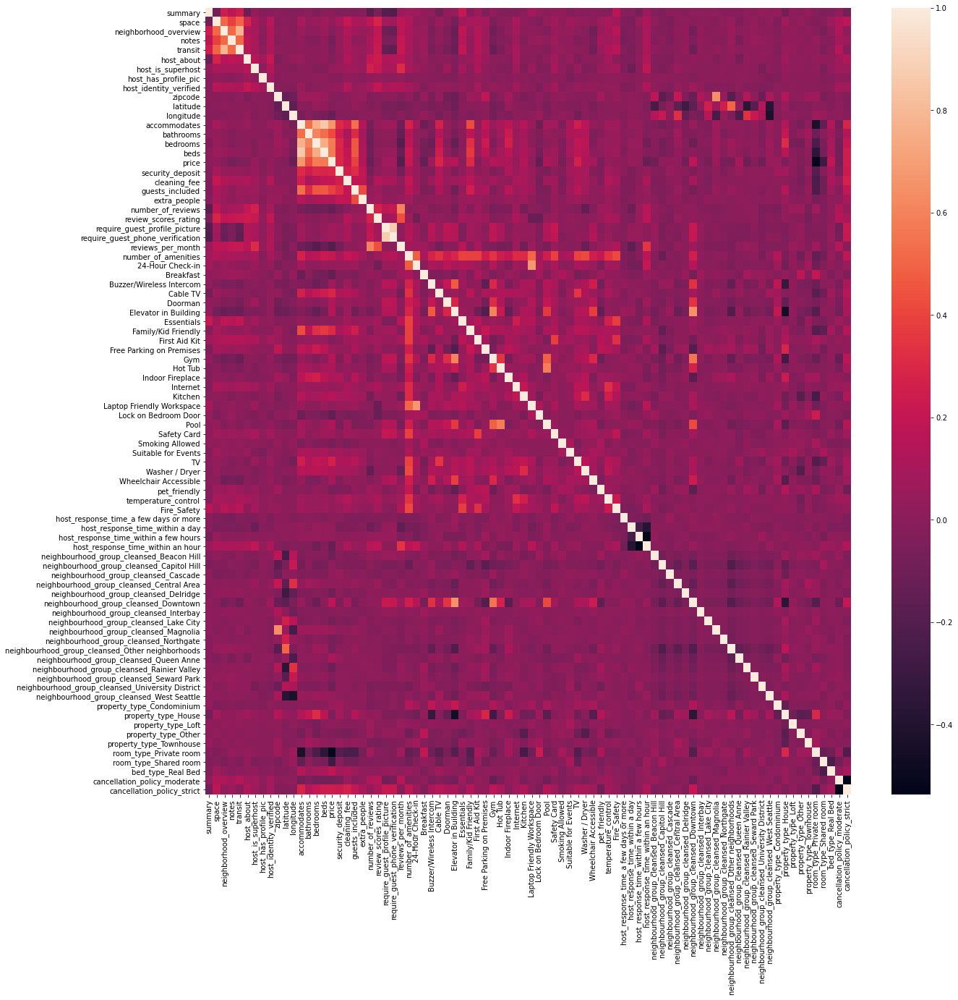

In [36]:
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap( df_listings.corr(), ax=ax)

In [37]:
# see the magnitude of the correlation
df_listings.corr()['price'].abs().sort_values(ascending=False).head(40)

price                                               1.000000
accommodates                                        0.664669
bedrooms                                            0.576581
beds                                                0.570002
room_type_Private room                              0.514671
bathrooms                                           0.421694
guests_included                                     0.383064
Family/Kid Friendly                                 0.305403
security_deposit                                    0.292559
Cable TV                                            0.288264
room_type_Shared room                               0.278810
TV                                                  0.266847
cancellation_policy_strict                          0.239198
cleaning_fee                                        0.209326
number_of_amenities                                 0.209117
reviews_per_month                                   0.195067
bed_type_Real Bed       

# Model

## Split (test-train)

In [38]:
y = df_listings['price']
X = df_listings.drop(columns='price')

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
#84 goes nuts !!!

og_y = og_df_listings['price']
og_X = og_df_listings.drop(columns='price')

og_X_train, og_X_test, og_y_train, og_y_test = train_test_split(og_X,og_y,test_size=0.2,random_state=42)


In [39]:
X_train.shape

(3053, 83)

## Train 

In [40]:
lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit
        
#Predict and score the model
y_train_preds = lm_model.predict(X_train)
y_test_preds = lm_model.predict(X_test) 

#Rsquared and y_test
train_score = r2_score(y_train, y_train_preds)
test_score = r2_score(y_test, y_test_preds)


print("The r-squared score for your train was {} on {} values.".format(train_score, len(y_train)))
print("The r-squared score for your model was {} on {} values.".format(test_score, len(y_test)))

The r-squared score for your train was 0.7063268591085097 on 3053 values.
The r-squared score for your model was 0.6851743397616965 on 764 values.


The following is an example to see the importance of grouping amenities, in the preparation process

In [41]:
lm_model2 = LinearRegression(normalize=True) # Instantiate
lm_model2.fit(og_X_train, og_y_train) #Fit
        
#Predict and score the model
og_y_train_preds = lm_model2.predict(og_X_train)
og_y_test_preds = lm_model2.predict(og_X_test) 

#Rsquared and y_test
og_train_score = r2_score(og_y_train, og_y_train_preds)
og_test_score = r2_score(og_y_test, og_y_test_preds)


print("The r-squared score for your train was {} on {} values.".format(og_train_score, len(y_train)))
print("The r-squared score for your model was {} on {} values.".format(og_test_score, len(y_test)))

The r-squared score for your train was 0.6101285920892339 on 3053 values.
The r-squared score for your model was 0.6159839515507273 on 764 values.


# Validation - plot

In [42]:
ax = sns.regplot(y_test,y_test_preds)

fig = ax.get_figure()  
fig.tight_layout()
fig.savefig('Images/reg_plot_model.png')
fig.set_title('Regression - Model')
plt.show()

AttributeError: 'Figure' object has no attribute 'set_title'

<AxesSubplot:xlabel='price'>

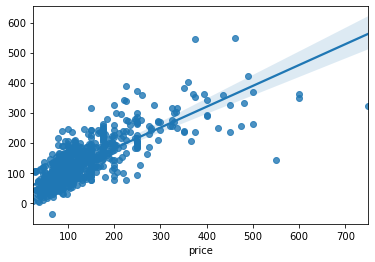

In [45]:
ax = sns.regplot(og_y_test,og_y_test_preds)

fig = ax.get_figure()
fig.set_title('Model - without grouped amenities')

## squared error

In [46]:
from sklearn.metrics import mean_squared_error

print(np.sqrt(mean_squared_error(y_test,y_test_preds)))
print(np.sqrt(mean_squared_error(og_y_test,og_y_test_preds)))

0.3179331448148898
54.03129248318233


# Coefficients

In [47]:
# pd.DataFrame(lm_model.coef_,index=X.columns).abs().sort_values(by=0,ascending=False).head(30)
coef = pd.DataFrame(lm_model.coef_,index=X.columns).sort_values(by=0,ascending=False)
coef2 = pd.DataFrame(lm_model2.coef_,index=og_X.columns).sort_values(by=0,ascending=False)
coef.loc[coef.abs().sort_values(by=0,ascending=False).head(30).index].head(30)


,0
room_type_Shared room,-0.869874
latitude,-0.827764
longitude,-0.717484
room_type_Private room,-0.418756
neighbourhood_group_cleansed_Delridge,-0.307590
neighbourhood_group_cleansed_Downtown,0.235803
Doorman,0.210340
property_type_Loft,0.201348
host_response_time_within an hour,-0.195946
neighbourhood_group_cleansed_Capitol Hill,0.177724


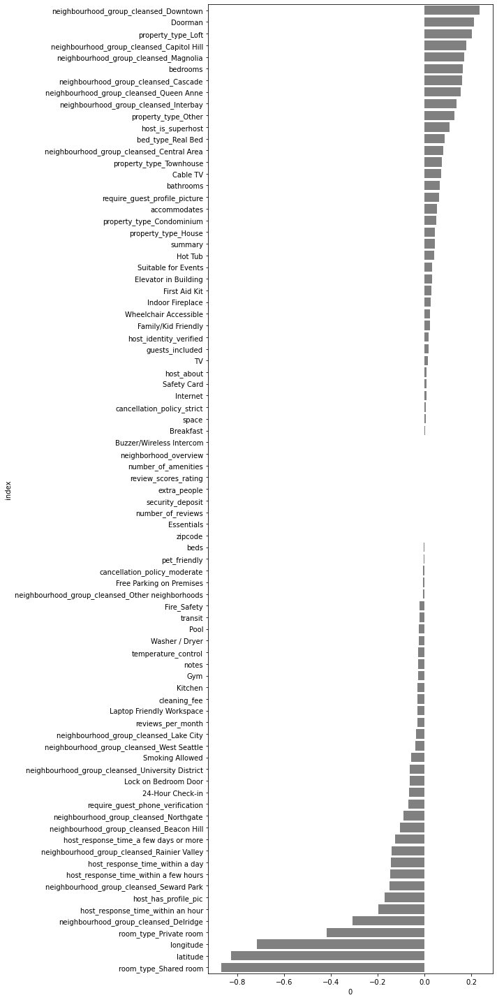

In [52]:
fig, ax = plt.subplots(figsize=(10,20))

# ax = ax.flatten()

sns.barplot(x=0, y='index', data=coef.reset_index(),color='grey',ax=ax)
# sns.barplot(x=0, y='index', data=coef.reset_index().head(60),ax=ax[0],color='grey')

#sns.barplot(x=0, y='index', data=coef2.reset_index().head(60),ax=ax[1],color='g')


fig = ax.get_figure()  
fig.tight_layout()
fig.savefig('Images/model_coefs.png')
plt.show()

### Amenities Coeficients

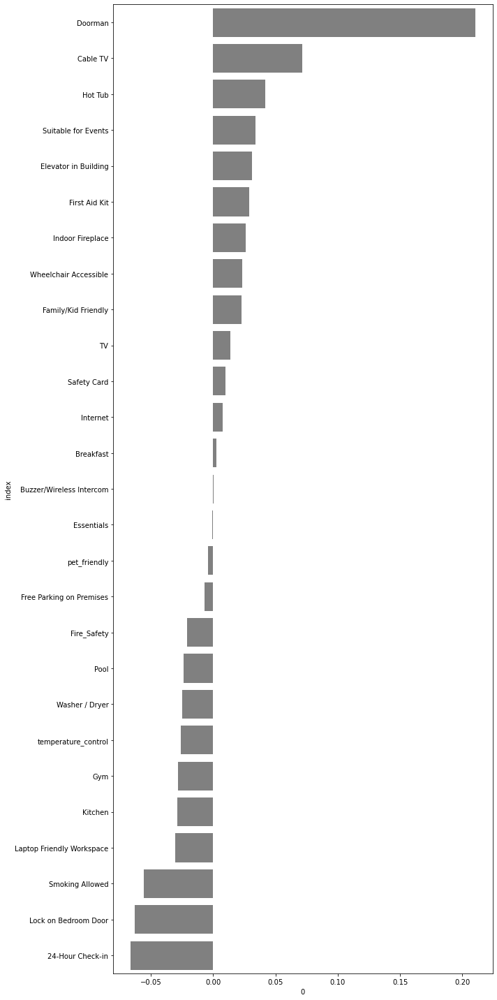

In [49]:
amenities_coef = coef.loc[[x for x in amenities_df.columns.values if x not in ['']]].sort_values(by=0,ascending=False).reset_index()
amenities_coef2 = coef2.loc[[x for x in og_amenities_df.columns.values if x not in ['']]].sort_values(by=0,ascending=False).reset_index()

fig, ax = plt.subplots(figsize=(10,20))


sns.barplot(x=0, y='index', data=amenities_coef,ax=ax,color='grey')
# sns.barplot(x=0, y='index', data=amenities_coef2,ax=ax[1],color='grey')

fig = ax.get_figure()  
fig.tight_layout()
fig.savefig('Images/amenities_coef.png')
plt.show() 